### Install Required Packages

We would be running `Stable Diffusion 2` so enable `GPU` under `View Resources > Change runtime type`

In [1]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-49921e12-1414-2091-e741-0b1e04ef05b2)


In [2]:
%%capture
!pip install diffusers
!pip install daam
!pip install git+https://github.com/RishiDarkDevil/daam-i2i.git
!pip install git+https://github.com/RishiDarkDevil/TITAN.git

### Import Necessary Libraries

We will load the necessary libraries required for generating DAAM outputs for input prompts.

In [3]:
# Plotting
from matplotlib import pyplot as plt

# Data Handling
import numpy as np

# Image Processing
import cv2
from PIL import Image

# Image Generation
from diffusers import StableDiffusionPipeline

# Heatmap generation
import daam
import daami2i

# annotations
import titan

### Load Model

In [4]:
DEVICE = 'cuda' # device

Now, let's load the `stabilityai/stable-diffusion-2-base` diffusion model.

In [5]:
model = StableDiffusionPipeline.from_pretrained('stabilityai/stable-diffusion-2-base')
model = model.to(DEVICE) # Set it to something else if needed, make sure DAAM supports that

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

### DAAM Image Attention

In [6]:
prompt = ['A woman is sitting in a chair reading a book with her head resting on her free hand.']

In [7]:
processed_prompt = titan.PromptHandler().clean_prompt(prompt)

Loading Models...

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


INFO:stanza:Downloading default packages for language: en (English) ...


INFO:stanza:Finished downloading models and saved to /root/stanza_resources.
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Loading these models for language: en (English):
| Processor | Package  |
------------------------
| tokenize  | combined |
| pos       | combined |
| lemma     | combined |

INFO:stanza:Using device: cuda
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: pos
INFO:stanza:Loading: lemma
INFO:stanza:Done loading processors!


Done
Tokenizing...Done
POS Tagging and Lemmatizing...Done
Processing...Done


In [8]:
processed_prompt

[('a woman is sitting in a chair reading a book with her head resting on her free hand .',
  ['woman', 'chair', 'book', 'head', 'hand'],
  ['woman', 'chair', 'book', 'head', 'hand'])]

In [9]:
with daam.trace(model) as daam_trc:
  with daami2i.trace(model) as daami2i_trc:
    output_image = model(processed_prompt[0][0]).images
    image_global_heat_map = daami2i_trc.compute_global_heat_map()
    word_global_heat_map = daam_trc.compute_global_heat_map()

  0%|          | 0/51 [00:00<?, ?it/s]

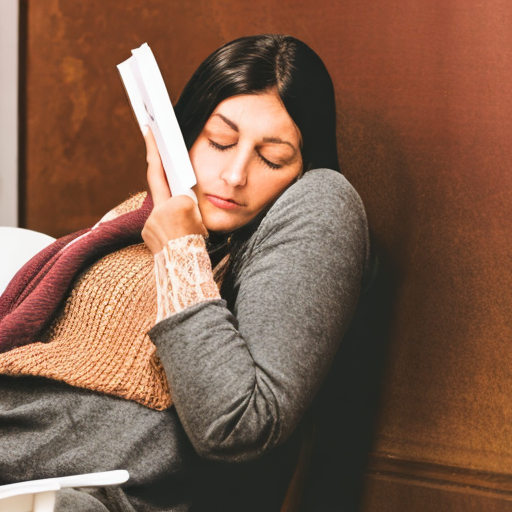

In [10]:
output_image[0]

How much attention does one part of image pays to other part of an image?

In [26]:
pix_pix_heatmap = image_global_heat_map.heat_maps.cpu().view(4096, -1).numpy()
pix_pix_heatmap = (pix_pix_heatmap - np.min(pix_pix_heatmap)) / (np.max(pix_pix_heatmap) - np.min(pix_pix_heatmap))
pix_pix_heatmap = np.array(pix_pix_heatmap  * 255, dtype = np.uint8)

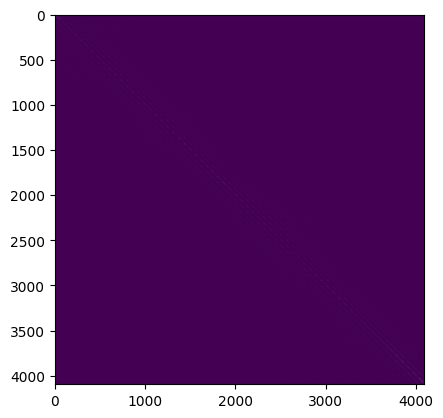

In [27]:
plt.imshow(pix_pix_heatmap)

In [29]:
blurred_heatmap = cv2.GaussianBlur(pix_pix_heatmap, (3,3), 0)
thresh = cv2.threshold(blurred_heatmap, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

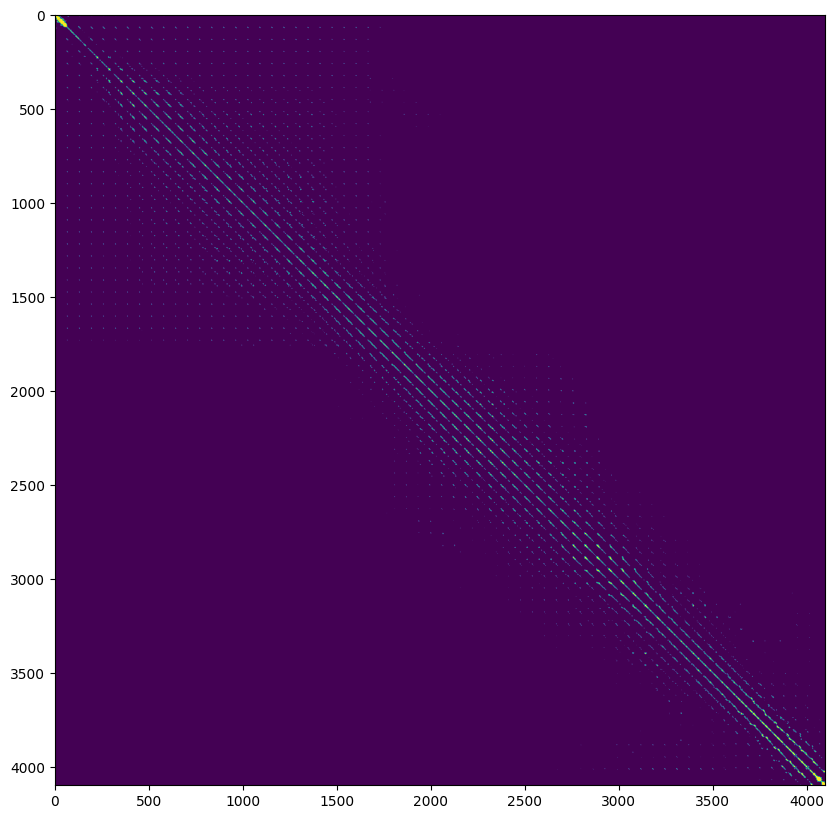

In [32]:
# Attention of the entire image on entire image
plt.figure(figsize=(10, 10))
plt.imshow(thresh)

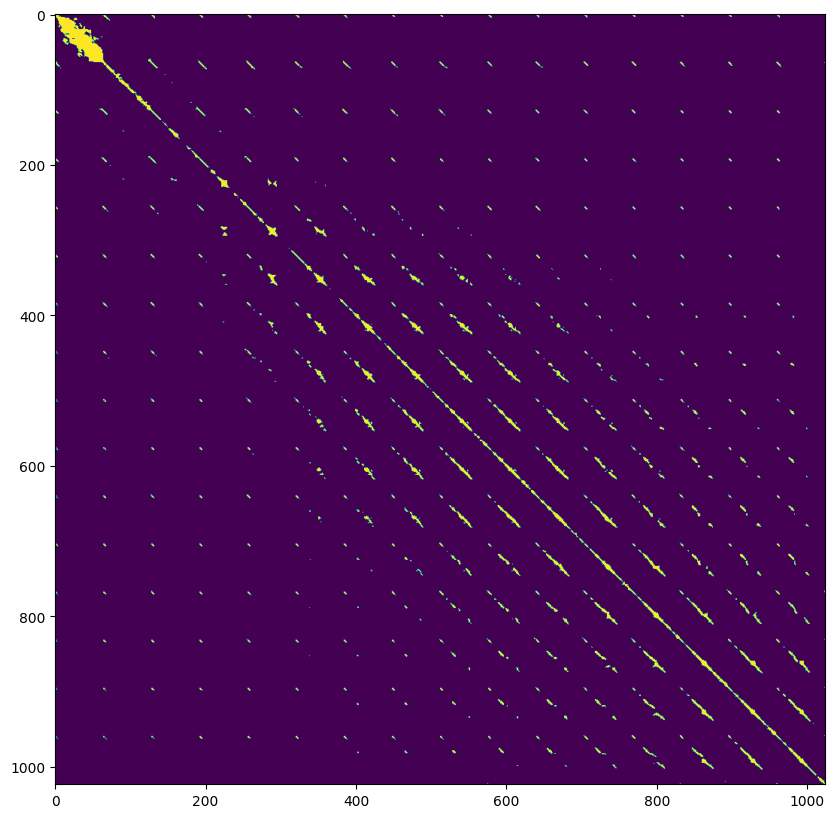

In [33]:
# Attention of the top 1/4th of the image on the top 1/4th of the image
plt.figure(figsize=(10, 10))
plt.imshow(thresh[:1024,:1024])

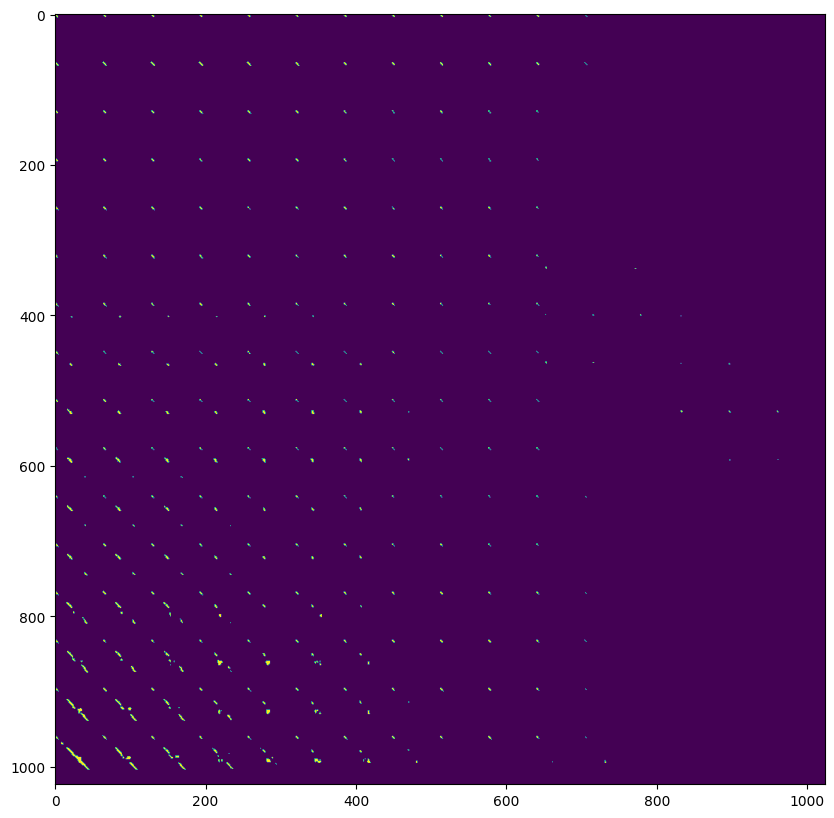

In [36]:
# Attention of the top 1/4th of the image on the 1/4th to 1/2th of the image from top
plt.figure(figsize=(10, 10))
plt.imshow(thresh[:1024,1024:2048])

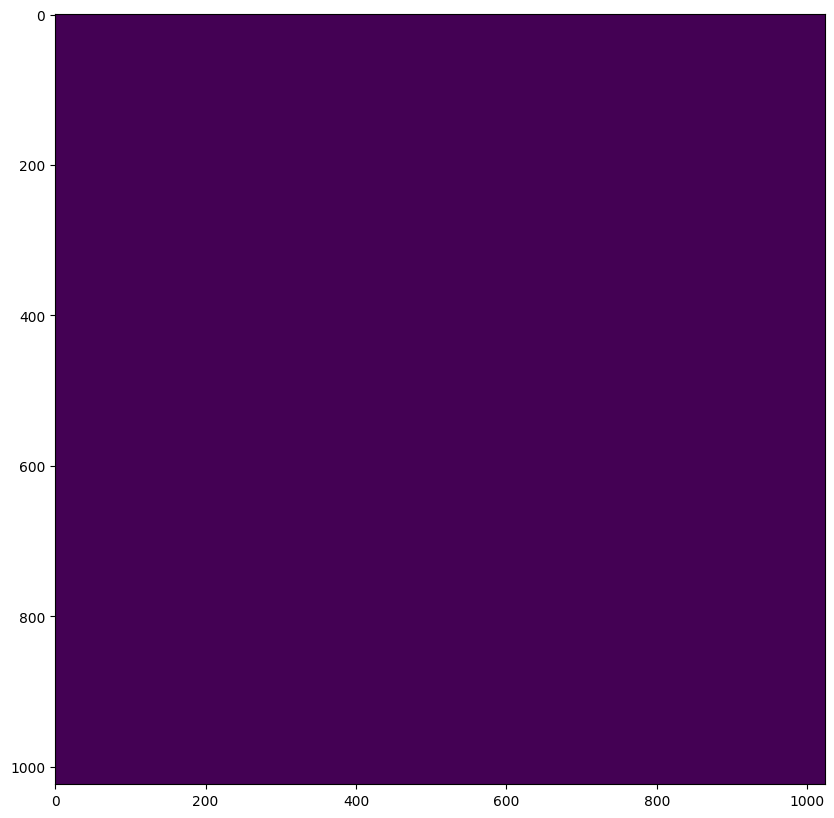

In [35]:
# Attention of the top 1/4th of the image on the 1/2 to 3/4th of the image from top
plt.figure(figsize=(10, 10))
plt.imshow(thresh[:1024,-2048:-1024])

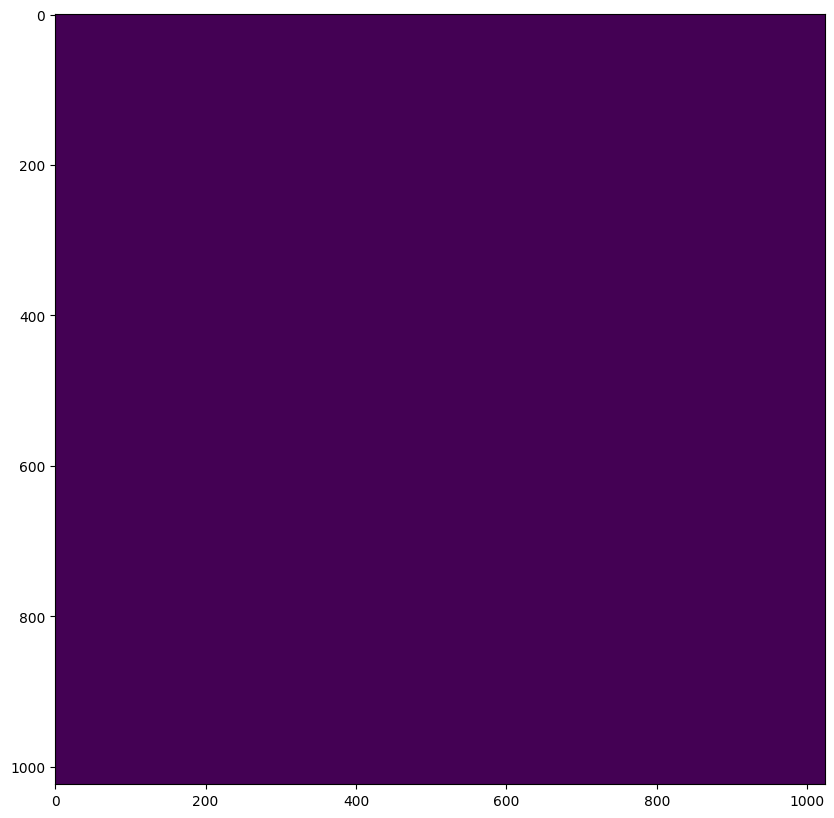

In [34]:
# Attention of the top 1/4th of the image on the bottom 1/4th of the image
plt.figure(figsize=(10, 10))
plt.imshow(thresh[:1024,-1024:])

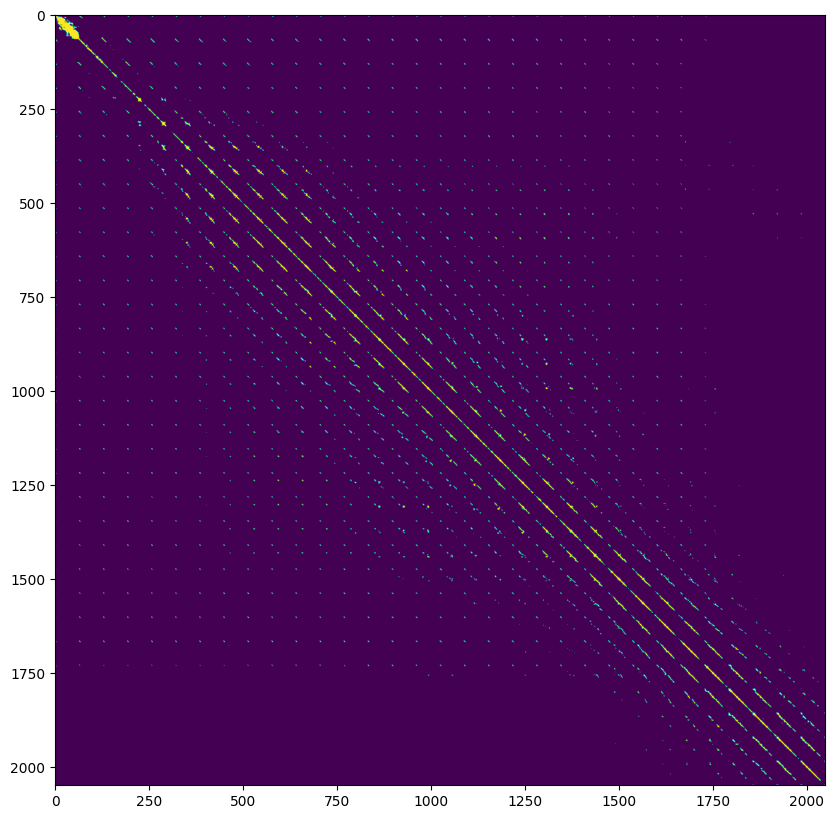

In [37]:
# Attention of the top 1/2 of the image on the top 1/2 of the image
plt.figure(figsize=(10, 10))
plt.imshow(thresh[:2048,:2048])

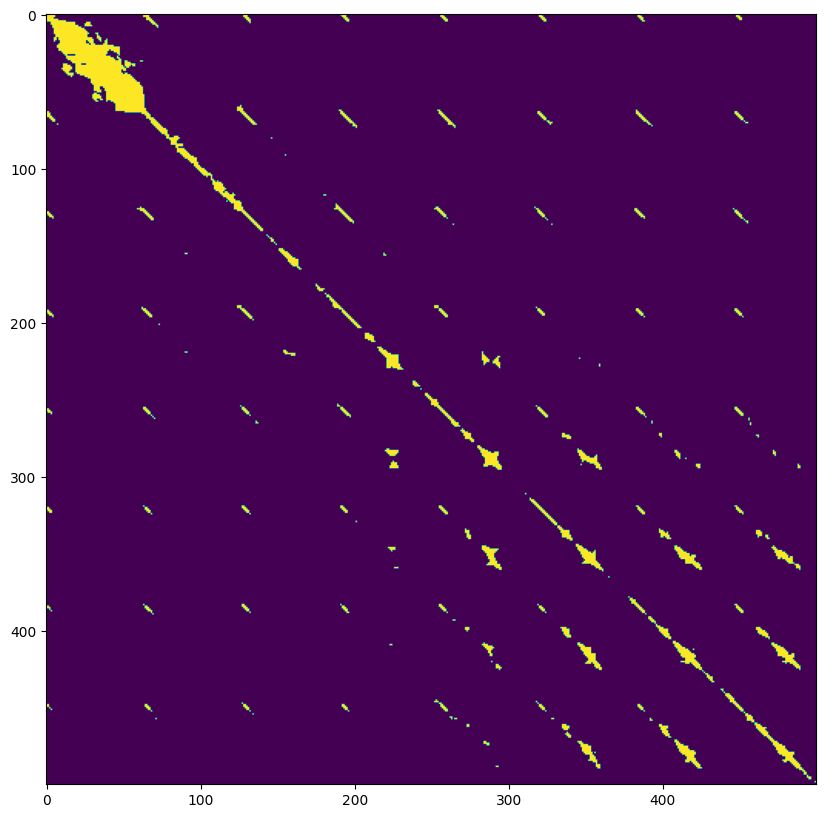

In [39]:
# Attention of the top 1/4th of the image on the top 1/4th of the image
plt.figure(figsize=(10, 10))
plt.imshow(thresh[:500,:500])

### Visualize Heatmaps

In [11]:
annotations = list()
object_annotator = titan.ObjectAnnotator()

In [12]:
for i, word in enumerate(processed_prompt[0][1]):
  # Compute heatmap for a non-stopword
  word_heatmap = word_global_heat_map.compute_word_heat_map(word).expand_as(output_image[0]).numpy()

  # Annotate the Word Heatmap for current word
  anns = object_annotator.wordheatmap_to_annotations(
    word_heatmap, 100*i, 1, i
    )
  
  annotations.append(anns)

In [13]:
len(annotations)

5

In [14]:
len(annotations[0])

1

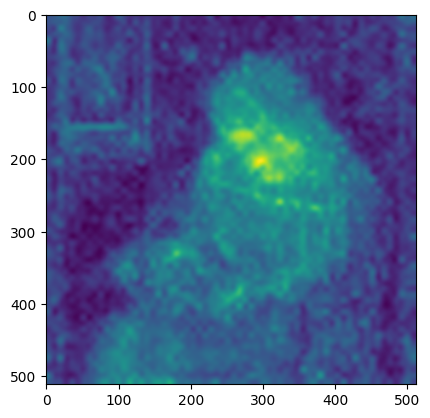

In [15]:
plt.imshow(word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][0]).expand_as(output_image[0]).numpy())

In [68]:
heatmaps = list()
for k in range(len(annotations[0])):
  # Compute heatmap for inner pixels for contour boundary specified
  pixel_heatmap = image_global_heat_map.compute_contour_heat_map(
      [[annotations[0][k]['segmentation'][0][i], annotations[0][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[0][k]['segmentation'][0]), 2)], 
      512, 512).expand_as(output_image[0]).numpy()

  # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

  heatmaps.append(heatmap[np.newaxis, :, :])

In [69]:
heatmap = np.mean(np.concatenate(heatmaps), 0)

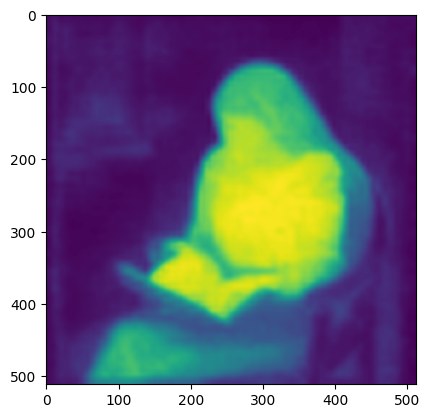

In [70]:
plt.imshow(heatmap)

In [19]:
len(annotations[1])

1

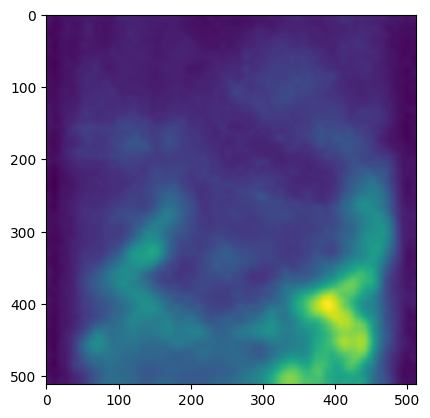

In [56]:
plt.imshow(word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][1]).expand_as(output_image[0]).numpy())

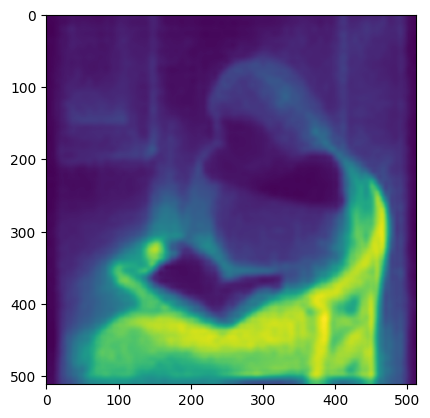

In [78]:
heatmaps = list()
for k in range(len(annotations[1])):
  # Compute heatmap for inner pixels for contour boundary specified
  pixel_heatmap = image_global_heat_map.compute_contour_heat_map(
      [[annotations[1][k]['segmentation'][0][i], annotations[1][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[1][k]['segmentation'][0]), 2)], 
      512, 512).expand_as(output_image[0]).numpy()

  # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

  heatmaps.append(heatmap[np.newaxis, :, :])

# Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

plt.imshow(heatmap)

In [58]:
len(annotations[2])

1

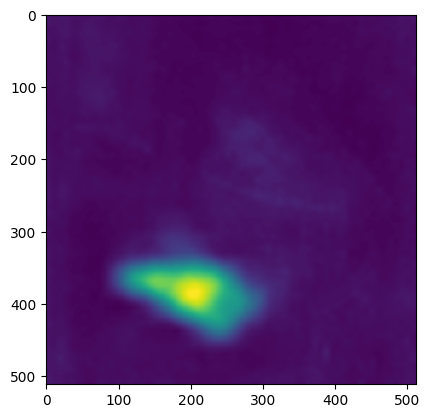

In [23]:
plt.imshow(word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][2]).expand_as(output_image[0]).numpy())

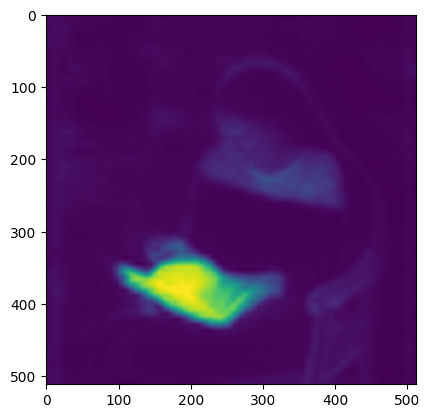

In [24]:
heatmaps = list()
for k in range(len(annotations[2])):
  # Compute heatmap for inner pixels for contour boundary specified
  pixel_heatmap = image_global_heat_map.compute_contour_heat_map(
      [[annotations[2][k]['segmentation'][0][i], annotations[2][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[2][k]['segmentation'][0]), 2)], 
      512, 512).expand_as(output_image[0]).numpy()

  # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

  heatmaps.append(heatmap[np.newaxis, :, :])

# Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

plt.imshow(heatmap)

In [25]:
len(annotations[3])

2

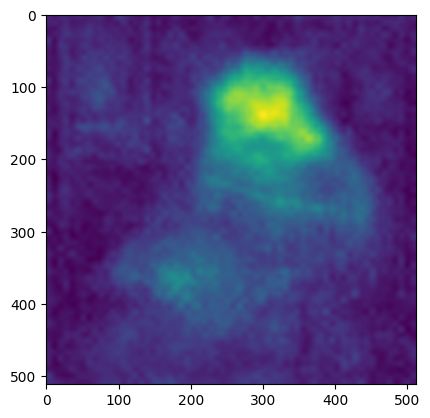

In [26]:
plt.imshow(word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][3]).expand_as(output_image[0]).numpy())

In [80]:
heatmaps = list()
for k in range(len(annotations[3])):
  # Compute heatmap for inner pixels for contour boundary specified
  pixel_heatmap = image_global_heat_map.compute_contour_heat_map(
      [[annotations[3][k]['segmentation'][0][i], annotations[3][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[3][k]['segmentation'][0]), 2)], 
      512, 512).expand_as(output_image[0]).numpy()

  # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

  heatmaps.append(heatmap[np.newaxis, :, :])

In [81]:
heatmap = np.mean(np.concatenate(heatmaps), 0)

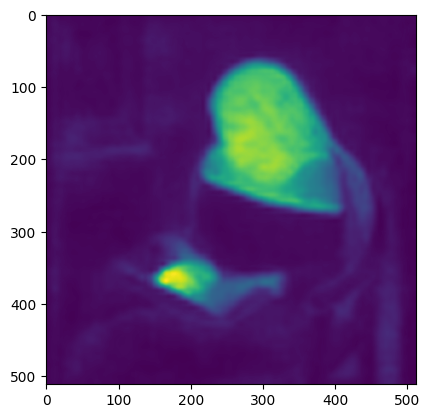

In [82]:
plt.imshow(heatmap)

In [30]:
len(annotations[4])

1

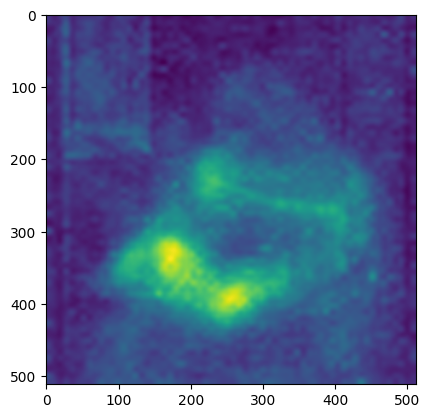

In [31]:
plt.imshow(word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][4]).expand_as(output_image[0]).numpy())

In [32]:
heatmaps = list()
for k in range(len(annotations[4])):
  # Compute heatmap for inner pixels for contour boundary specified
  pixel_heatmap = image_global_heat_map.compute_contour_heat_map(
      [[annotations[4][k]['segmentation'][0][i], annotations[4][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[4][k]['segmentation'][0]), 2)], 
      512, 512).expand_as(output_image[0]).numpy()

  # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

  heatmaps.append(heatmap[np.newaxis, :, :])

In [33]:
heatmap = np.mean(np.concatenate(heatmaps), 0)

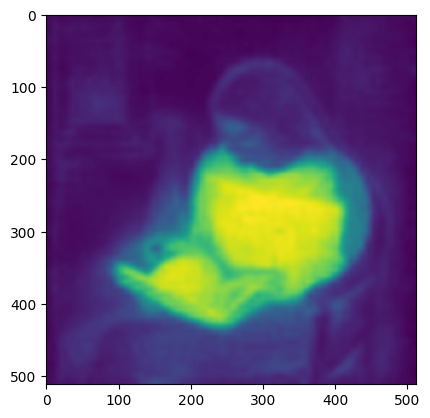

In [34]:
plt.imshow(heatmap)

### Object Detections

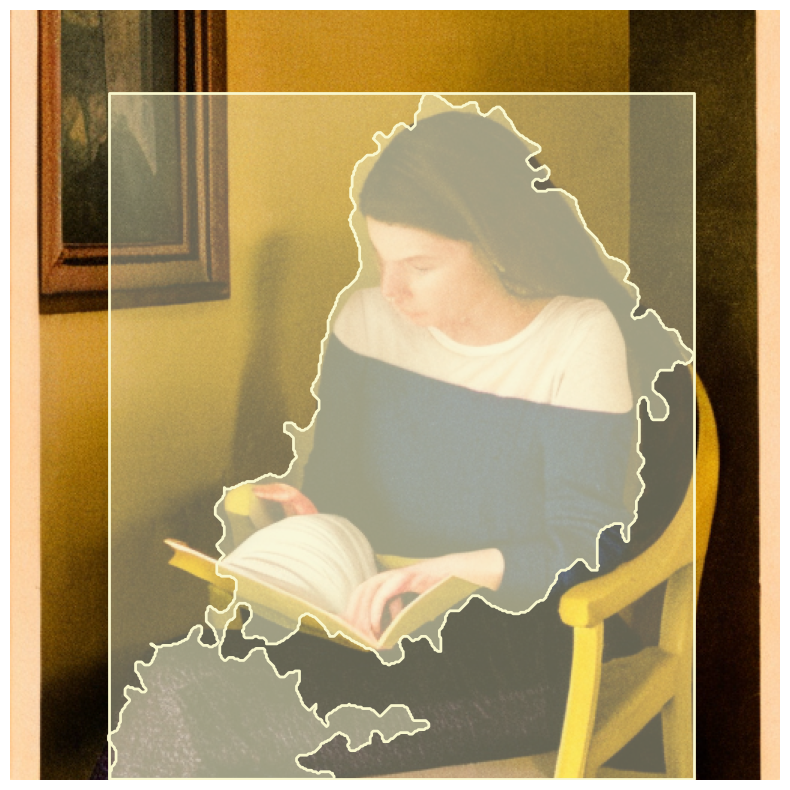

In [76]:
# Word Heatmap Version - woman
object_annotator.show_annotations(np.asarray(output_image[0]), annotations[0])

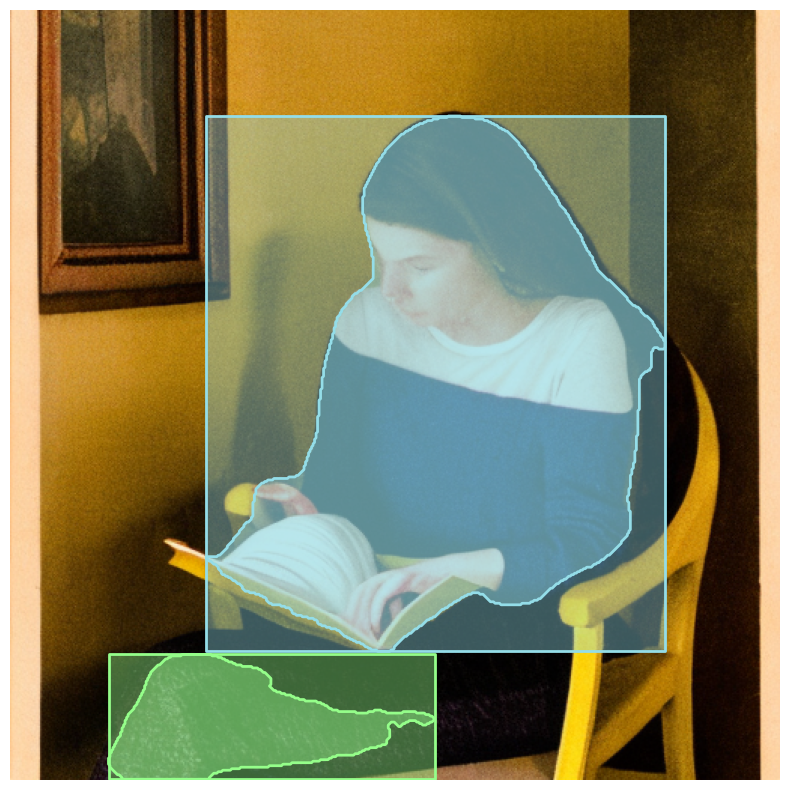

In [75]:
# Image Heatmap Version - woman
object_annotator.show_annotations(np.asarray(output_image[0]), object_annotator.wordheatmap_to_annotations(heatmap/255))

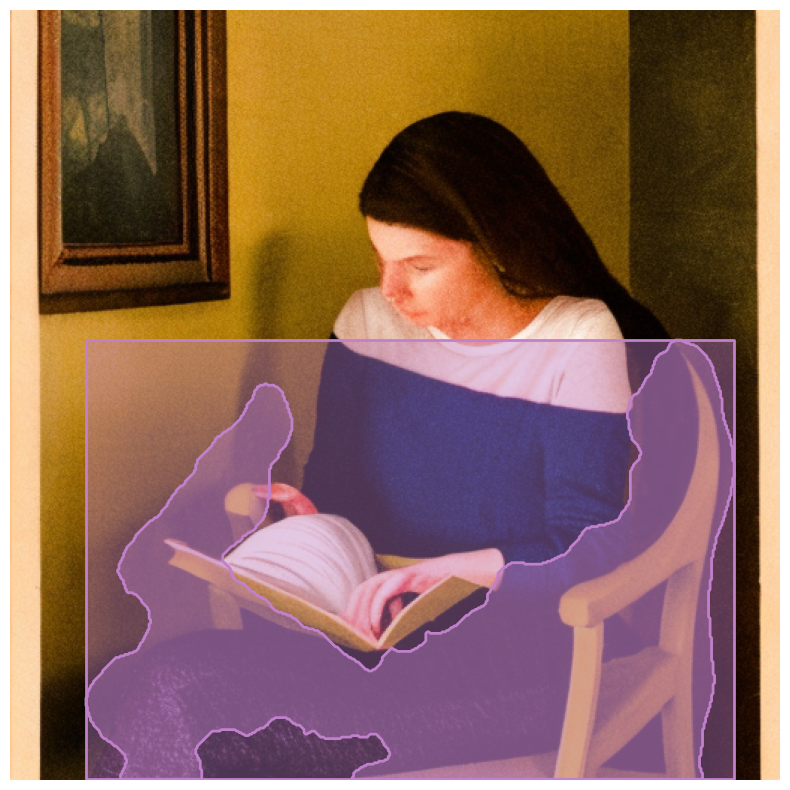

In [77]:
# Word Heatmap Version - chair
object_annotator.show_annotations(np.asarray(output_image[0]), annotations[1])

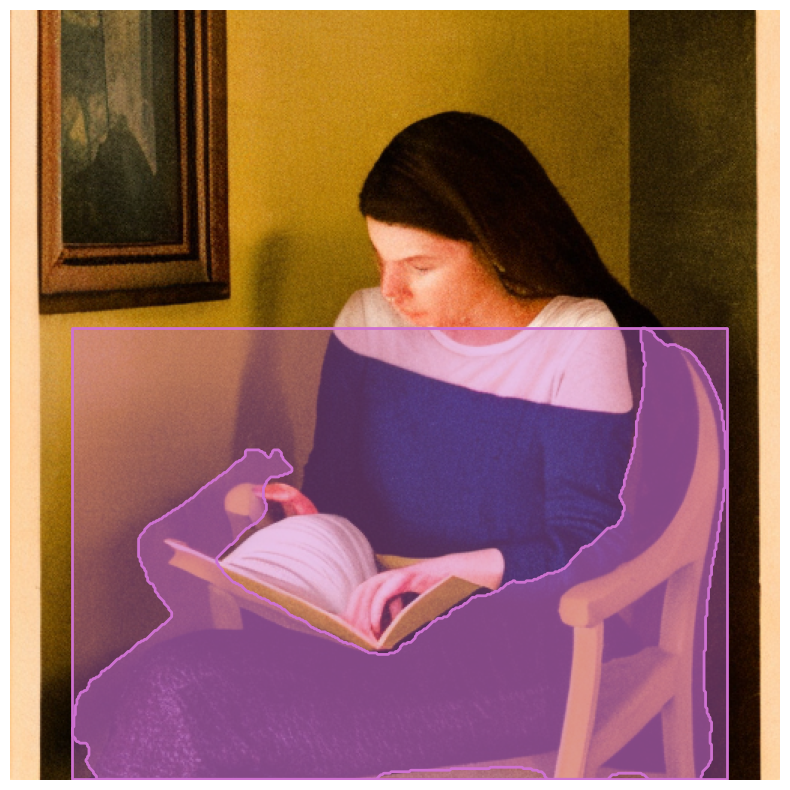

In [79]:
# Image Heatmap Version - chair
object_annotator.show_annotations(np.asarray(output_image[0]), object_annotator.wordheatmap_to_annotations(heatmap/255))

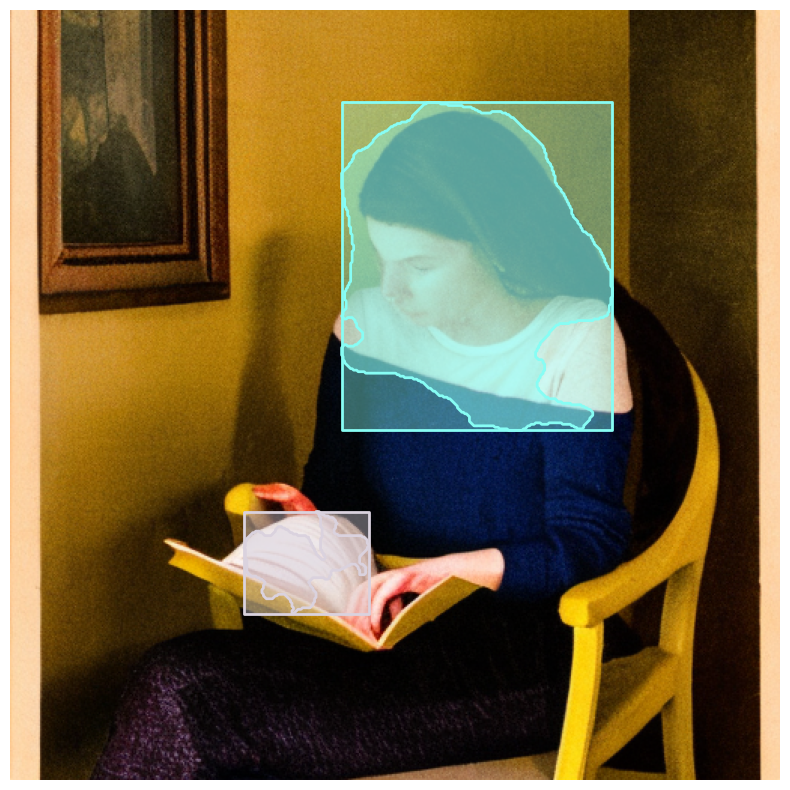

In [84]:
# Word Heatmap Version - head
object_annotator.show_annotations(np.asarray(output_image[0]), annotations[3])

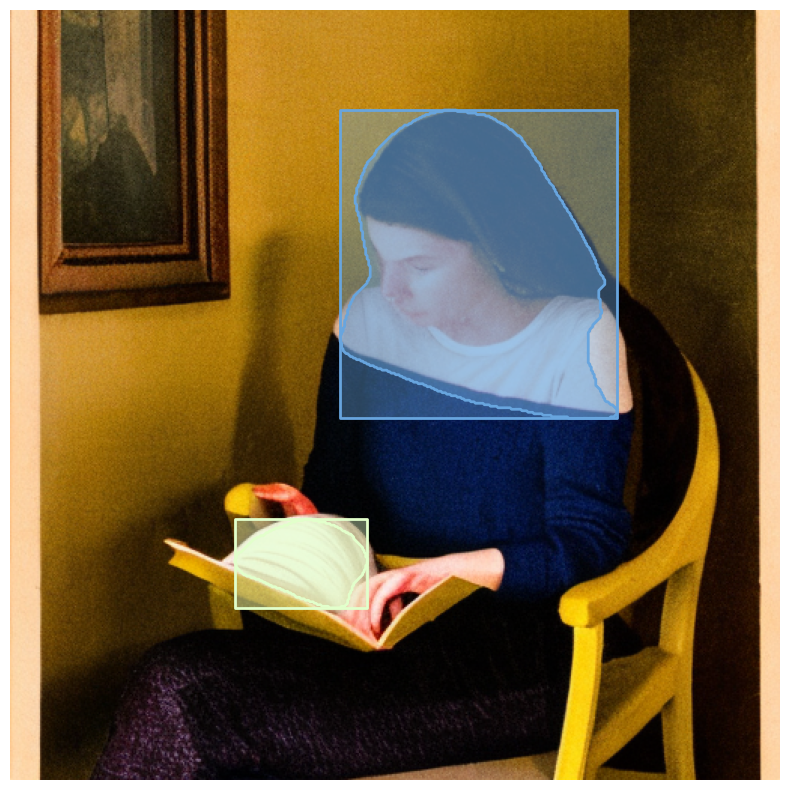

In [83]:
# Image Heatmap Version - head
object_annotator.show_annotations(np.asarray(output_image[0]), object_annotator.wordheatmap_to_annotations(heatmap/255))

### Iterative Refining

Has No Effect

In [33]:
N_ITER = 2

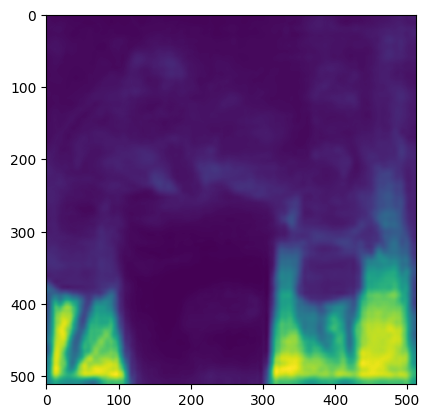

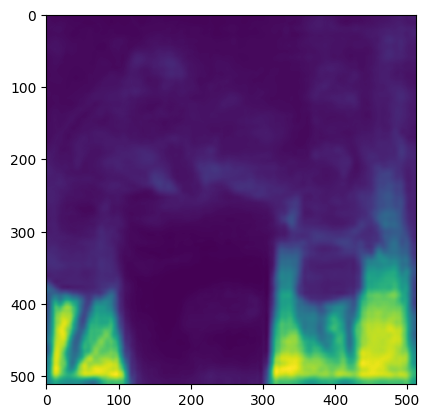

In [34]:
for _ in range(N_ITER):

  # image2image heatmap annotations
  annotations1 = object_annotator.wordheatmap_to_annotations(heatmap)
  
  # image2image heatmap for the above newly refined contour
  heatmaps1 = list()
  for k in range(len(annotations1)):

    # Compute heatmap for inner pixels for contour boundary specified
    pixel_heatmap1 = image_global_heat_map.compute_contour_heat_map(
        [[annotations1[k]['segmentation'][0][i], annotations1[k]['segmentation'][0][i+1]] for i in range(0, len(annotations1[k]['segmentation'][0]), 2)], 
        512, 512).expand_as(output_image[0]).numpy()

    # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
    heatmap1 = np.array(pixel_heatmap1 * 255, dtype = np.uint8)

    heatmaps1.append(heatmap1[np.newaxis, :, :])
  
  if len(annotations) <= 1:
    heatmap = heatmaps[0]
  else:
    heatmap = np.mean(np.concatenate(heatmaps), 0)

  plt.imshow(heatmap)

  plt.show()